> ## Visão Computacional
> Ulilé Indeque  
> William Gabriel
> ##### Professor: Thales Vieira - Terceira lista de exercício

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def show_by_plt(img, x=30, y=20):
    fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(x, y))
    axes.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes.axis('off')
    plt.show()

def show_imgs(imgs):
    fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(40, 20))
    for ax, img in zip(axes.flat, imgs):
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.axis('off')

In [ ]:
image_paths = [
    'dataset/panorama/parta1.png',
    'dataset/panorama/parta2.png',
    'dataset/panorama/parta3.png',
    'dataset/panorama/parta4.png',
    'dataset/panorama/parta5.png',
    'dataset/panorama/partb1.png',
    'dataset/panorama/partb2.png',
    'dataset/panorama/partb3.png',
    'dataset/panorama/partb4.png',
    'dataset/panorama/partb5.png',
]

> ## Questão - 1

In [ ]:
imgs = list(map(lambda path: cv2.imread(path), image_paths))
gray_imgs = list(map(lambda img: cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), imgs))

In [ ]:
orb = cv2.ORB_create(nfeatures=15000)
keypoints_descs = list(map(lambda img: orb.detectAndCompute(img, None), gray_imgs))
keyps, descs = zip(*keypoints_descs)

In [ ]:
def draw_matches(img1, keypoints1, img2, keypoints2, matches):
    max_height = max(img1.shape[0], img2.shape[0])

    img1_resized = cv2.resize(img1, (int(img1.shape[1] * max_height / img1.shape[0]), max_height))
    img2_resized = cv2.resize(img2, (int(img2.shape[1] * max_height / img2.shape[0]), max_height))

    output_img = np.hstack((img1_resized, img2_resized))

    for match in matches:
        (x1, y1) = keypoints1[match.queryIdx].pt
        (x2, y2) = keypoints2[match.trainIdx].pt
        cv2.circle(output_img, (int(x1), int(y1)), 4, (255, 0, 0), 1)
        cv2.circle(output_img, (int(x2) + img1_resized.shape[1], int(y2)), 4, (255, 0, 0), 1)
        cv2.line(output_img, (int(x1), int(y1)), (int(x2) + img1_resized.shape[1], int(y2)), (255, 0, 0), 1)

    return output_img

def warp_imgs(img1, img2, H):
    rows1, cols1 = img1.shape[:2]
    rows2, cols2 = img2.shape[:2]

    list_of_points_1 = np.float32([[0,0], [0, rows1],[cols1, rows1], [cols1, 0]]).reshape(-1, 1, 2)
    temp_points = np.float32([[0,0], [0,rows2], [cols2,rows2], [cols2,0]]).reshape(-1,1,2)
    list_of_points_2 = cv2.perspectiveTransform(temp_points, H)

    list_of_points = np.concatenate((list_of_points_1, list_of_points_2), axis=0)

    x_min, y_min = np.int32(list_of_points.min(axis=0).ravel() - 0.5)
    x_max, y_max = np.int32(list_of_points.max(axis=0).ravel() + 0.5)

    translation_dist = [-x_min, -y_min]
    H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])

    output_img = cv2.warpPerspective(img2, H_translation.dot(H), (x_max-x_min, y_max-y_min))
    output_img[translation_dist[1]:rows1+translation_dist[1], translation_dist[0]:cols1+translation_dist[0]] = img1

    return output_img

In [ ]:
def find_matchs(imgs, gray_imgs, keyps, descs):
    all_matches = []
    all_results = []

    for i in range(5):
        bf = cv2.BFMatcher_create(cv2.NORM_HAMMING)
        matches = bf.knnMatch(descs[i], descs[i+5], k=2)
        good_match = []

        for m, n in matches:
            if m.distance < 0.6 * n.distance:
                good_match.append(m)
        matched = draw_matches(imgs[i], keyps[i], imgs[i+5], keyps[i+5], good_match)
        all_matches.append(matched)

        if len(good_match) > 10:
            src_pts = np.float32([keyps[i][m.queryIdx].pt for m in good_match]).reshape(-1,1,2)
            dst_pts = np.float32([keyps[i+5][m.trainIdx].pt for m in good_match]).reshape(-1,1,2)

        M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        result = warp_imgs(imgs[i+5], imgs[i], M)
        all_results.append(result)
    return (all_matches, all_results)
(all_matches, all_results) = find_matchs(imgs, gray_imgs, keyps, descs)

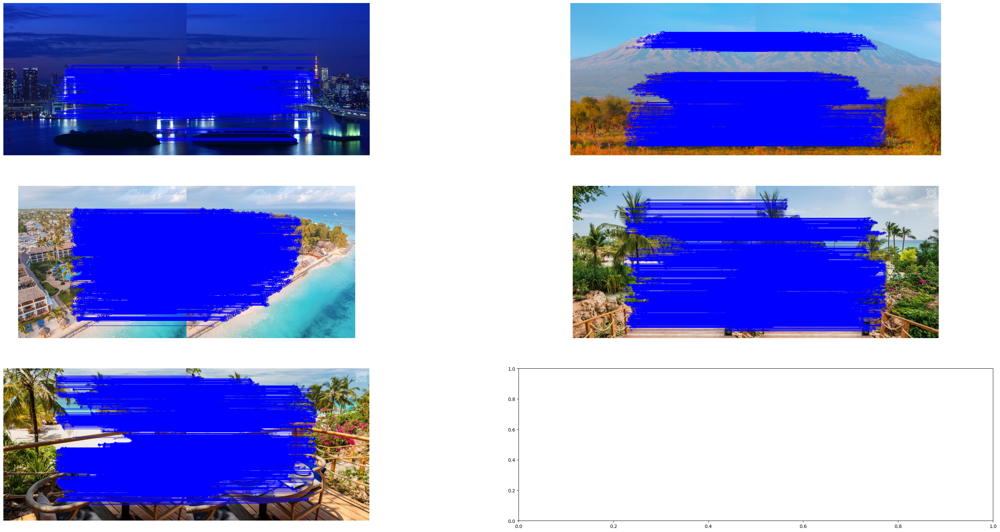

In [ ]:
show_imgs(all_matches)

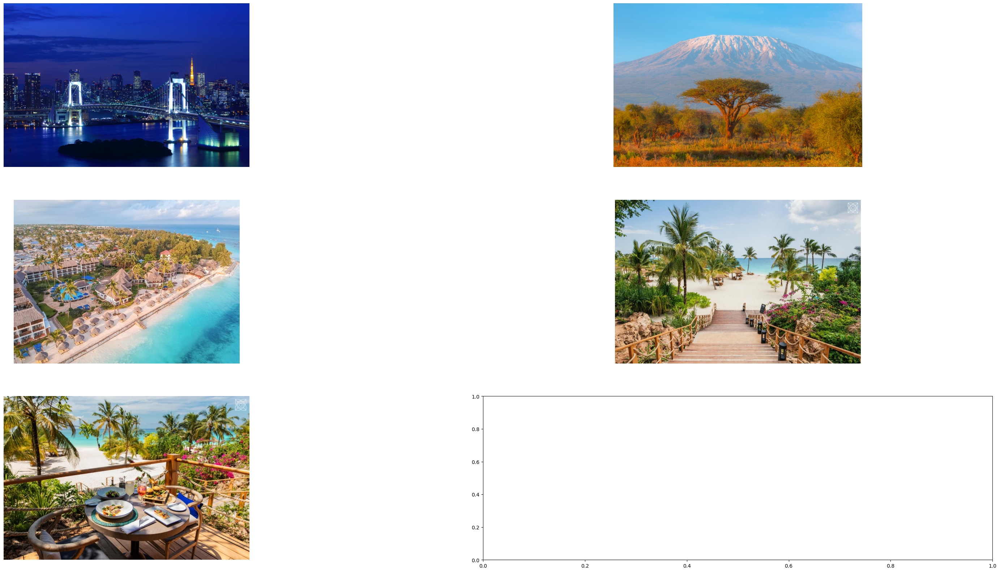

In [ ]:
show_imgs(all_results)

> ### Questão - 2

In [ ]:
image_paths = [
    'dataset/panorama/partc1.png',
    'dataset/panorama/partc2.png',
    'dataset/panorama/partc3.png',
    'dataset/panorama/partc4.png',
    'dataset/panorama/partc5.png',
]

In [ ]:
all_matches.copy()

In [ ]:
imgs3 = list(map(lambda path: cv2.imread(path), image_paths))
gray_imgs3 = list(map(lambda img: cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), imgs3))

In [ ]:
orb = cv2.ORB_create(nfeatures=15000)
keypoints_descs = list(map(lambda img: orb.detectAndCompute(img, None), gray_imgs3))
keyps3, descs3 = zip(*keypoints_descs)

In [ ]:
def find_matchs(imgs, gray_imgs, keyps, descs):
    all_matches = []
    all_results = []

    for i in range(5):
        bf = cv2.BFMatcher_create(cv2.NORM_HAMMING)
        matches = bf.knnMatch(descs[i], descs[i+5], k=2)
        good_match = []

        for m, n in matches:
            if m.distance < 0.6 * n.distance:
                good_match.append(m)
        matched = draw_matches(imgs[i], keyps[i], imgs[i+5], keyps[i+5], good_match)
        all_matches.append(matched)

        if len(good_match) > 10:
            src_pts = np.float32([keyps[i][m.queryIdx].pt for m in good_match]).reshape(-1,1,2)
            dst_pts = np.float32([keyps[i+5][m.trainIdx].pt for m in good_match]).reshape(-1,1,2)

        M, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        result = warp_imgs(imgs[i+5], imgs[i], M)
        all_results.append(result)
    return (all_matches, all_results)
(all_matches, all_results) = find_matchs(imgs, gray_imgs, keyps, descs)

> ### Questão - 3
>>> ##### anexo base: https://medium.com/acmvit/how-to-project-an-image-in-perspective-view-of-a-background-image-opencv-python-d101bdf966bc

In [ ]:
positions=[]
positions2=[]
count=0
def selection(background):
    def draw_circle(event,x,y,flags,param):
        global positions,count
        # If event is Left Button Click then store the coordinate in the lists, positions and positions2
        if event == cv2.EVENT_LBUTTONUP:
            cv2.circle(background,(x,y),2,(255,0,0),-1)
            positions.append([x,y])
            if(count!=3):
                positions2.append([x,y])
            elif(count==3):
                positions2.insert(2,[x,y])
            count+=1
    # Defing a window named 'image'
    cv2.namedWindow('image')
    cv2.setMouseCallback('image',draw_circle)

    while(True):
        cv2.imshow('image',background)
        k = cv2.waitKey(20) & 0xFF
        if k == 27:
            break
    cv2.destroyAllWindows()

In [ ]:
def change_pers(names):
    for name in names:
        background = cv2.imread("dataset/bandeiras/piscina.jpg")
        bd = cv2.imread(f"dataset/bandeiras/{name}.jpg")

        positions=[]
        positions2=[]
        count=0

        height, width = background.shape[:2]
        h1,w1 = bd.shape[:2]

        selection(background)
        pts1=np.float32([[0,0],[w1,0],[0,h1],[w1,h1]])
        pts2=np.float32(positions)
        h, mask = cv2.findHomography(pts1, pts2, cv2.RANSAC,5.0)

        height, width, channels = background.shape
        im1Reg = cv2.warpPerspective(bd, h, (width, height))
        mask2 = np.zeros(background.shape, dtype=np.uint8)

        roi_corners2 = np.int32(positions2)

        channel_count2 = background.shape[2]
        ignore_mask_color2 = (255,)*channel_count2

        cv2.fillConvexPoly(mask2, roi_corners2, ignore_mask_color2)

        mask2 = cv2.bitwise_not(mask2)
        masked_image2 = cv2.bitwise_and(background, mask2)

        #Using Bitwise or to merge the two images
        band = cv2.bitwise_or(im1Reg, masked_image2)
        cv2.imwrite('dataset/bandeiras/piscina_out.jpg',band)

names = [f"img{i}" for i in range(2, 11)]
change_pers(names)

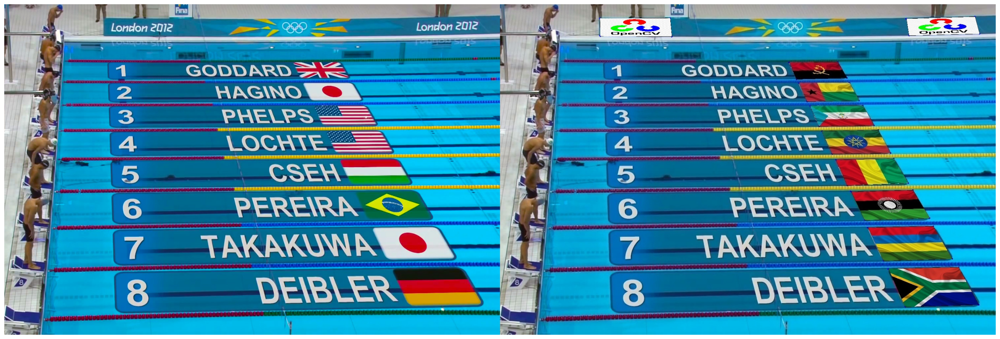

In [ ]:
image_paths = ["dataset/bandeiras/piscina.jpg", "dataset/bandeiras/piscina_out.jpg"]
imgs = list(map(lambda path: cv2.imread(path), image_paths))
show_by_plt(np.hstack(imgs))

> ### Questão - 4
>>> ##### anexo base:
>>> * https://docs.opencv.org/4.x/dc/dbb/tutorial_py_calibration.html
>>> * https://www.kaggle.com/datasets/danielwe14/stereocamera-chessboard-pictures/data

In [ ]:
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
obj = np.zeros((6*7, 3), np.float32)
obj[:, :2] = np.mgrid[0:7, 0:6].T.reshape(-1, 2)

In [ ]:
num_x, num_y = 11, 7
objp = np.zeros((num_x*num_y, 3), np.float32)
objp[:,:2] = np.mgrid[0:num_x, 0:num_y].T.reshape(-1,2)

objpoints = []
imgpoints = []
chess_drawed = []
imgs = []
names = glob.glob('dataset/chess/*.png')

for name in names:
    img = cv2.imread(name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    imgs.append(img)
    #show_by_plt(gray)
    ret, corners = cv2.findChessboardCorners(gray, (num_x, num_y), None)

    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners)

        aux = cv2.drawChessboardCorners(img, (num_x,num_y), corners, ret)
        chess_drawed.append(aux)

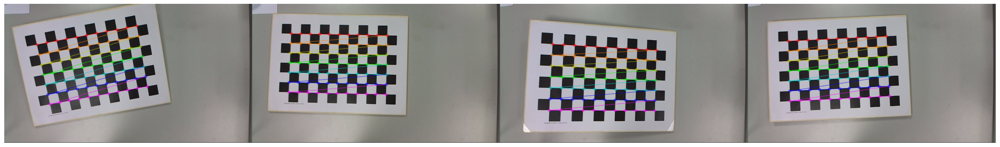

In [ ]:
chess_drawed = np.hstack(chess_drawed)
show_by_plt(chess_drawed)

In [ ]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

In [ ]:
def polar_coordinates(r, theta, width, height):
    x = r * np.cos(theta) + 1.5 * width
    y = r * np.sin(theta) + 1.5 * height
    z = 0
    return x, y, z

def draw_circle():
    height, width = 0.3, 0.3
    radio, n_points =  0.5 * width, 360
    angle = 2 * np.pi / n_points

    coord = np.array(list(map(lambda x: polar_coordinates(radio, x*angle, width, height), range(n_points))))

    outcome = []
    imgs = list(map(lambda name: cv2.imread(name), names))

    for idx, img in enumerate(imgs):
        drawed, _ = cv2.projectPoints(coord, rvecs[idx], tvecs[idx], mtx, dist)
        for i in range(len(drawed)):
            next_point = (i + 1) % len(drawed)
            aux = cv2.line(img, tuple(drawed[i][0].astype(int)), tuple(drawed[next_point][0].astype(int)), (255, 0, 0), 2)
        outcome.append(aux)
    return outcome

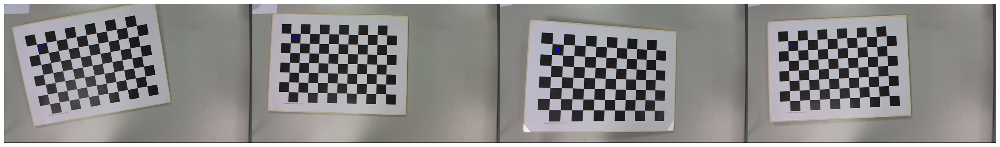

In [ ]:
outcome = draw_circle()
show_by_plt(np.hstack(outcome))